## **Vehicle Detection Project**


* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier

* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 

* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.

* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.

* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.

* Estimate a bounding box for vehicles detected.

### 1. Help Functions  (color and HOG)

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler

##### 1> Compute Color Histogram Features 

In [2]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(16, 16)):
    
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel()
    
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    
    # Compute the histogram of the RGB channels separately 
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


##### 2> Compute HOG

In [3]:
from skimage.feature import hog

In [4]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

### 2. Image_Pipeline

##### 1> Load Trained Model

In [5]:
import pickle
from sklearn.externals import joblib
# load the model from disk
filename = 'svc.p'
global svc
svc = joblib.load(filename)

filename = 'X_scaler.p'
global X_scaler
X_scaler = joblib.load(filename)

##### 2> Find Cars (Single HOG feature extraction on the whole image)

adpated from course material

In [154]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, cells_per_step = 2):
    
    # save all the rectangle boxes
    bboxes = []
    
    # Define Region to search
    img_tosearch = img[ystart:ystop,:,:]
    
    # Change to YUV YCrCb as used in training
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2YCrCb)
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg)
            hist_features = color_hist(subimg)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                bboxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return bboxes
    

##### 3> Multi-scale Windows

In [173]:
def multi_scale(img, svc, X_scaler, orient, pix_per_cell, cell_per_block):
    window_list = []
    ystart = [405, 400, 450]
    ystop = [480, 550, 650]
    scales = [1, 1.5, 2.5]
    cells_per_step = [1, 2, 2]
    for i in range(len(scales)):
        bboxes = find_cars(img, ystart[i], ystop[i], scales[i], svc, X_scaler, orient, pix_per_cell, cell_per_block, cells_per_step[i])
        window_list.append(bboxes)
    window_list = [item for sublist in window_list for item in sublist] 
    return window_list
    

##### 4> Draw Boxes

In [174]:
# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

##### 5> Test on images 

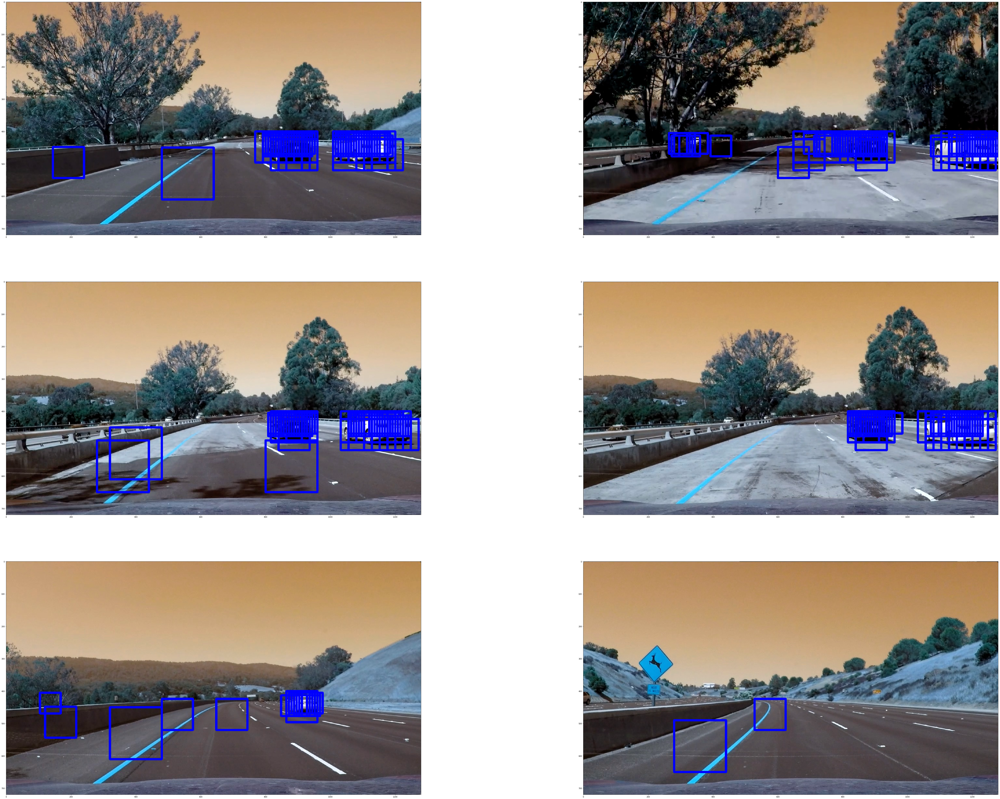

In [175]:
# parameters used in training

orient = 9
pix_per_cell = 8
cell_per_block = 4


# Make a list of the test images
names = glob.glob('./test_images/*.jpg')
test_images = []
output_images = []


# Read .png images
for name in names:
    img = cv2.imread(name)
    test_images.append(img)
    bboxes = multi_scale(img, svc, X_scaler, orient, pix_per_cell, cell_per_block)
    output_image = draw_boxes(img, bboxes)
    output_images.append(output_image)

plt.figure(figsize=(40, 40))
for i in range(len(output_images)):
    plt.subplot(3, 2, i + 1) 
    plt.imshow(output_images[i])
   # plt.axis('off')
    plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)


##### 6> Heat Map

In [176]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    
    # save boxes positions
    boxes_draw = []

    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        boxes_draw.append(bbox)
    # Return the image
    return img, boxes_draw

##### 7> Image Pipeline

In [177]:
from scipy.ndimage.measurements import label

def find_vehicles_pipeline(image, Heatmap = False):
    
    
    # parameters used in training
    orient = 9
    pix_per_cell = 8
    cell_per_block = 4

    # Load image
    img = image.copy()
    
    # find vehicles
    hot_windows = multi_scale(img, svc, X_scaler, orient, pix_per_cell, cell_per_block)
    
    # add heat
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat, hot_windows)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,7)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    output_image, _ = draw_labeled_bboxes(np.copy(image), labels)
    if Heatmap == True:
        return output_image, heat
    else:
        return output_image
    

##### 8> Load image and draw boxes

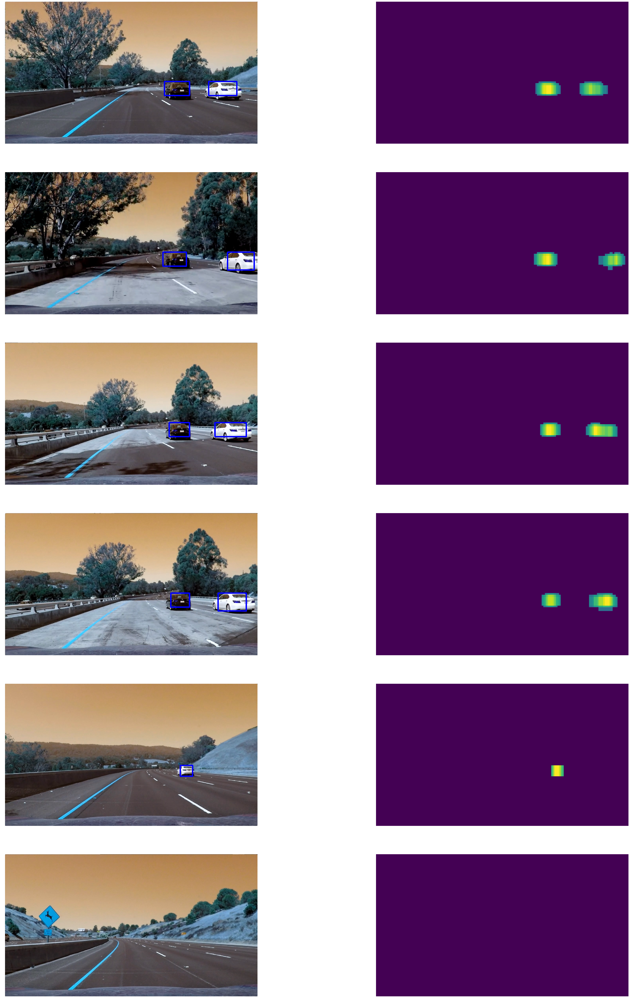

In [178]:
from sklearn.preprocessing import StandardScaler

# Make a list of the test images
final_images = []
heat_images = []

# Read .png images
for img in test_images:
    final_image, heat = find_vehicles_pipeline(img, Heatmap = True)
    final_images.append(final_image)
    heat_images.append(heat)

plt.figure(figsize=(80, 120))
for i in range(len(final_images)):
    plt.subplot(6, 2, i * 2 + 1) 
    plt.imshow(final_images[i])
    plt.axis('off')
    plt.subplot(6, 2, i * 2 + 2)
    plt.imshow(heat_images[i])
    plt.axis('off')
    #plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)


### 3. Vehicle Tracking in Video

##### 1> Define a class to save previous boxes

In [180]:
# Define a class to store data from video
class Vehicle_Tracking():
    
    def __init__(self):
        # recent heatmap
        self.recent_heat = []
        
    def throw_old_value(self):
        '''
         keep most recent values
        '''
        if len(self.recent_heat) > 5:
            self.recent_heat = self.recent_heat[-5:]


##### 2> Video Pipeline

In [181]:
def video_pipeline(image):

    
    # parameters used in training
    orient = 9
    pix_per_cell = 8
    cell_per_block = 4

    # Load image
    img = image.copy() 
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    
    
    # find vehicles
    hot_windows = multi_scale(img, svc, X_scaler, orient, pix_per_cell, cell_per_block)
    
    # add heat
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat, hot_windows)
    
    # single image heat remove
    heat = apply_threshold(heat, 6)
    
    # add recent heat
    track.recent_heat.append(heat)
    
    # keep the most recent rectangles
    track.throw_old_value()
      
    # calculate the heatmap of recent images
    recent_heat = np.zeros(heat.shape)
    for i in range(len(track.recent_heat)):
        recent_heat = recent_heat + track.recent_heat[i]
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(recent_heat, len(track.recent_heat) * 6)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    output_image, bboxes = draw_labeled_bboxes(np.copy(image), labels)
   
        
    return cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)
    


In [182]:
from moviepy.editor import VideoFileClip
track = Vehicle_Tracking()

test_out_file2 = 'project_video_out.mp4'
clip_test2 = VideoFileClip('project_video.mp4')
clip_test_out2 = clip_test2.fl_image(video_pipeline)
%time clip_test_out2.write_videofile(test_out_file2, audio=False)

[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4





  0%|          | 0/1261 [00:00<?, ?it/s]


  0%|          | 1/1261 [00:00<18:34,  1.13it/s]


  0%|          | 2/1261 [00:02<21:04,  1.00s/it]


  0%|          | 3/1261 [00:03<21:10,  1.01s/it]


  0%|          | 4/1261 [00:04<22:58,  1.10s/it]


  0%|          | 5/1261 [00:05<22:38,  1.08s/it]


  0%|          | 6/1261 [00:06<23:37,  1.13s/it]


  1%|          | 7/1261 [00:08<24:35,  1.18s/it]


  1%|          | 8/1261 [00:09<25:00,  1.20s/it]


  1%|          | 9/1261 [00:10<25:16,  1.21s/it]


  1%|          | 10/1261 [00:12<26:14,  1.26s/it]


  1%|          | 11/1261 [00:13<26:14,  1.26s/it]


  1%|          | 12/1261 [00:14<25:38,  1.23s/it]


  1%|          | 13/1261 [00:15<24:54,  1.20s/it]


  1%|          | 14/1261 [00:16<24:42,  1.19s/it]


  1%|          | 15/1261 [00:17<24:35,  1.18s/it]


  1%|▏         | 16/1261 [00:18<24:13,  1.17s/it]


  1%|▏         | 17/1261 [00:19<24:08,  1.16s/it]


  1%|▏         | 18/1261 [00:20<23:52,  1.15s/it]


  2%|▏         | 19/1261 [0

 11%|█         | 134/1261 [02:18<19:20,  1.03s/it]


 11%|█         | 135/1261 [02:19<19:19,  1.03s/it]


 11%|█         | 136/1261 [02:20<19:20,  1.03s/it]


 11%|█         | 137/1261 [02:21<19:19,  1.03s/it]


 11%|█         | 138/1261 [02:22<19:18,  1.03s/it]


 11%|█         | 139/1261 [02:23<19:17,  1.03s/it]


 11%|█         | 140/1261 [02:24<19:16,  1.03s/it]


 11%|█         | 141/1261 [02:25<19:14,  1.03s/it]


 11%|█▏        | 142/1261 [02:26<19:13,  1.03s/it]


 11%|█▏        | 143/1261 [02:27<19:11,  1.03s/it]


 11%|█▏        | 144/1261 [02:28<19:08,  1.03s/it]


 11%|█▏        | 145/1261 [02:28<19:06,  1.03s/it]


 12%|█▏        | 146/1261 [02:29<19:04,  1.03s/it]


 12%|█▏        | 147/1261 [02:30<19:02,  1.03s/it]


 12%|█▏        | 148/1261 [02:31<18:59,  1.02s/it]


 12%|█▏        | 149/1261 [02:32<18:57,  1.02s/it]


 12%|█▏        | 150/1261 [02:33<18:55,  1.02s/it]


 12%|█▏        | 151/1261 [02:34<18:54,  1.02s/it]


 12%|█▏        | 152/1261 [02:35<18:53,  1.02s

 21%|██        | 266/1261 [04:40<17:29,  1.05s/it]


 21%|██        | 267/1261 [04:41<17:29,  1.06s/it]


 21%|██▏       | 268/1261 [04:42<17:27,  1.05s/it]


 21%|██▏       | 269/1261 [04:43<17:25,  1.05s/it]


 21%|██▏       | 270/1261 [04:44<17:24,  1.05s/it]


 21%|██▏       | 271/1261 [04:45<17:22,  1.05s/it]


 22%|██▏       | 272/1261 [04:46<17:20,  1.05s/it]


 22%|██▏       | 273/1261 [04:47<17:19,  1.05s/it]


 22%|██▏       | 274/1261 [04:48<17:17,  1.05s/it]


 22%|██▏       | 275/1261 [04:48<17:16,  1.05s/it]


 22%|██▏       | 276/1261 [04:49<17:14,  1.05s/it]


 22%|██▏       | 277/1261 [04:50<17:12,  1.05s/it]


 22%|██▏       | 278/1261 [04:51<17:10,  1.05s/it]


 22%|██▏       | 279/1261 [04:52<17:09,  1.05s/it]


 22%|██▏       | 280/1261 [04:53<17:07,  1.05s/it]


 22%|██▏       | 281/1261 [04:54<17:06,  1.05s/it]


 22%|██▏       | 282/1261 [04:55<17:04,  1.05s/it]


 22%|██▏       | 283/1261 [04:55<17:02,  1.05s/it]


 23%|██▎       | 284/1261 [04:56<17:01,  1.05s

 32%|███▏      | 398/1261 [07:03<15:18,  1.06s/it]


 32%|███▏      | 399/1261 [07:04<15:17,  1.06s/it]


 32%|███▏      | 400/1261 [07:05<15:15,  1.06s/it]


 32%|███▏      | 401/1261 [07:06<15:14,  1.06s/it]


 32%|███▏      | 402/1261 [07:07<15:12,  1.06s/it]


 32%|███▏      | 403/1261 [07:07<15:10,  1.06s/it]


 32%|███▏      | 404/1261 [07:08<15:09,  1.06s/it]


 32%|███▏      | 405/1261 [07:09<15:07,  1.06s/it]


 32%|███▏      | 406/1261 [07:10<15:06,  1.06s/it]


 32%|███▏      | 407/1261 [07:11<15:05,  1.06s/it]


 32%|███▏      | 408/1261 [07:12<15:04,  1.06s/it]


 32%|███▏      | 409/1261 [07:13<15:03,  1.06s/it]


 33%|███▎      | 410/1261 [07:14<15:02,  1.06s/it]


 33%|███▎      | 411/1261 [07:15<15:01,  1.06s/it]


 33%|███▎      | 412/1261 [07:16<15:00,  1.06s/it]


 33%|███▎      | 413/1261 [07:18<14:59,  1.06s/it]


 33%|███▎      | 414/1261 [07:19<14:59,  1.06s/it]


 33%|███▎      | 415/1261 [07:21<14:59,  1.06s/it]


 33%|███▎      | 416/1261 [07:22<14:58,  1.06s

 42%|████▏     | 530/1261 [09:07<12:35,  1.03s/it]


 42%|████▏     | 531/1261 [09:08<12:33,  1.03s/it]


 42%|████▏     | 532/1261 [09:09<12:32,  1.03s/it]


 42%|████▏     | 533/1261 [09:10<12:31,  1.03s/it]


 42%|████▏     | 534/1261 [09:10<12:29,  1.03s/it]


 42%|████▏     | 535/1261 [09:11<12:28,  1.03s/it]


 43%|████▎     | 536/1261 [09:12<12:27,  1.03s/it]


 43%|████▎     | 537/1261 [09:13<12:26,  1.03s/it]


 43%|████▎     | 538/1261 [09:14<12:25,  1.03s/it]


 43%|████▎     | 539/1261 [09:15<12:23,  1.03s/it]


 43%|████▎     | 540/1261 [09:16<12:22,  1.03s/it]


 43%|████▎     | 541/1261 [09:16<12:21,  1.03s/it]


 43%|████▎     | 542/1261 [09:17<12:19,  1.03s/it]


 43%|████▎     | 543/1261 [09:18<12:18,  1.03s/it]


 43%|████▎     | 544/1261 [09:19<12:17,  1.03s/it]


 43%|████▎     | 545/1261 [09:20<12:15,  1.03s/it]


 43%|████▎     | 546/1261 [09:20<12:14,  1.03s/it]


 43%|████▎     | 547/1261 [09:21<12:13,  1.03s/it]


 43%|████▎     | 548/1261 [09:22<12:12,  1.03s

 52%|█████▏    | 662/1261 [10:57<09:54,  1.01it/s]


 53%|█████▎    | 663/1261 [10:57<09:53,  1.01it/s]


 53%|█████▎    | 664/1261 [10:58<09:52,  1.01it/s]


 53%|█████▎    | 665/1261 [10:59<09:51,  1.01it/s]


 53%|█████▎    | 666/1261 [11:00<09:49,  1.01it/s]


 53%|█████▎    | 667/1261 [11:01<09:48,  1.01it/s]


 53%|█████▎    | 668/1261 [11:01<09:47,  1.01it/s]


 53%|█████▎    | 669/1261 [11:02<09:46,  1.01it/s]


 53%|█████▎    | 670/1261 [11:03<09:45,  1.01it/s]


 53%|█████▎    | 671/1261 [11:04<09:44,  1.01it/s]


 53%|█████▎    | 672/1261 [11:05<09:43,  1.01it/s]


 53%|█████▎    | 673/1261 [11:05<09:41,  1.01it/s]


 53%|█████▎    | 674/1261 [11:06<09:40,  1.01it/s]


 54%|█████▎    | 675/1261 [11:07<09:39,  1.01it/s]


 54%|█████▎    | 676/1261 [11:08<09:38,  1.01it/s]


 54%|█████▎    | 677/1261 [11:09<09:37,  1.01it/s]


 54%|█████▍    | 678/1261 [11:10<09:36,  1.01it/s]


 54%|█████▍    | 679/1261 [11:10<09:34,  1.01it/s]


 54%|█████▍    | 680/1261 [11:11<09:33,  1.01i

 63%|██████▎   | 794/1261 [12:46<07:30,  1.04it/s]


 63%|██████▎   | 795/1261 [12:47<07:29,  1.04it/s]


 63%|██████▎   | 796/1261 [12:48<07:28,  1.04it/s]


 63%|██████▎   | 797/1261 [12:49<07:27,  1.04it/s]


 63%|██████▎   | 798/1261 [12:49<07:26,  1.04it/s]


 63%|██████▎   | 799/1261 [12:50<07:25,  1.04it/s]


 63%|██████▎   | 800/1261 [12:51<07:24,  1.04it/s]


 64%|██████▎   | 801/1261 [12:52<07:23,  1.04it/s]


 64%|██████▎   | 802/1261 [12:53<07:22,  1.04it/s]


 64%|██████▎   | 803/1261 [12:54<07:21,  1.04it/s]


 64%|██████▍   | 804/1261 [12:54<07:20,  1.04it/s]


 64%|██████▍   | 805/1261 [12:55<07:19,  1.04it/s]


 64%|██████▍   | 806/1261 [12:56<07:18,  1.04it/s]


 64%|██████▍   | 807/1261 [12:57<07:17,  1.04it/s]


 64%|██████▍   | 808/1261 [12:58<07:16,  1.04it/s]


 64%|██████▍   | 809/1261 [12:58<07:15,  1.04it/s]


 64%|██████▍   | 810/1261 [12:59<07:14,  1.04it/s]


 64%|██████▍   | 811/1261 [13:00<07:13,  1.04it/s]


 64%|██████▍   | 812/1261 [13:01<07:12,  1.04i

 73%|███████▎  | 926/1261 [14:35<05:16,  1.06it/s]


 74%|███████▎  | 927/1261 [14:36<05:15,  1.06it/s]


 74%|███████▎  | 928/1261 [14:37<05:14,  1.06it/s]


 74%|███████▎  | 929/1261 [14:38<05:13,  1.06it/s]


 74%|███████▍  | 930/1261 [14:39<05:12,  1.06it/s]


 74%|███████▍  | 931/1261 [14:39<05:11,  1.06it/s]


 74%|███████▍  | 932/1261 [14:40<05:10,  1.06it/s]


 74%|███████▍  | 933/1261 [14:41<05:09,  1.06it/s]


 74%|███████▍  | 934/1261 [14:42<05:08,  1.06it/s]


 74%|███████▍  | 935/1261 [14:43<05:07,  1.06it/s]


 74%|███████▍  | 936/1261 [14:44<05:06,  1.06it/s]


 74%|███████▍  | 937/1261 [14:44<05:05,  1.06it/s]


 74%|███████▍  | 938/1261 [14:45<05:04,  1.06it/s]


 74%|███████▍  | 939/1261 [14:46<05:03,  1.06it/s]


 75%|███████▍  | 940/1261 [14:47<05:02,  1.06it/s]


 75%|███████▍  | 941/1261 [14:48<05:02,  1.06it/s]


 75%|███████▍  | 942/1261 [14:48<05:01,  1.06it/s]


 75%|███████▍  | 943/1261 [14:49<05:00,  1.06it/s]


 75%|███████▍  | 944/1261 [14:50<04:59,  1.06i

 84%|████████▍ | 1057/1261 [16:50<03:14,  1.05it/s]


 84%|████████▍ | 1058/1261 [16:51<03:13,  1.05it/s]


 84%|████████▍ | 1059/1261 [16:51<03:13,  1.05it/s]


 84%|████████▍ | 1060/1261 [16:52<03:12,  1.05it/s]


 84%|████████▍ | 1061/1261 [16:53<03:11,  1.05it/s]


 84%|████████▍ | 1062/1261 [16:54<03:10,  1.05it/s]


 84%|████████▍ | 1063/1261 [16:55<03:09,  1.05it/s]


 84%|████████▍ | 1064/1261 [16:56<03:08,  1.05it/s]


 84%|████████▍ | 1065/1261 [16:57<03:07,  1.05it/s]


 85%|████████▍ | 1066/1261 [16:57<03:06,  1.05it/s]


 85%|████████▍ | 1067/1261 [16:58<03:05,  1.05it/s]


 85%|████████▍ | 1068/1261 [16:59<03:04,  1.05it/s]


 85%|████████▍ | 1069/1261 [17:00<03:03,  1.05it/s]


 85%|████████▍ | 1070/1261 [17:01<03:02,  1.05it/s]


 85%|████████▍ | 1071/1261 [17:02<03:01,  1.05it/s]


 85%|████████▌ | 1072/1261 [17:03<03:00,  1.05it/s]


 85%|████████▌ | 1073/1261 [17:05<02:59,  1.05it/s]


 85%|████████▌ | 1074/1261 [17:06<02:58,  1.05it/s]


 85%|████████▌ | 1075/1261 [

 94%|█████████▍| 1187/1261 [18:59<01:11,  1.04it/s]


 94%|█████████▍| 1188/1261 [18:59<01:10,  1.04it/s]


 94%|█████████▍| 1189/1261 [19:00<01:09,  1.04it/s]


 94%|█████████▍| 1190/1261 [19:01<01:08,  1.04it/s]


 94%|█████████▍| 1191/1261 [19:02<01:07,  1.04it/s]


 95%|█████████▍| 1192/1261 [19:03<01:06,  1.04it/s]


 95%|█████████▍| 1193/1261 [19:03<01:05,  1.04it/s]


 95%|█████████▍| 1194/1261 [19:04<01:04,  1.04it/s]


 95%|█████████▍| 1195/1261 [19:05<01:03,  1.04it/s]


 95%|█████████▍| 1196/1261 [19:06<01:02,  1.04it/s]


 95%|█████████▍| 1197/1261 [19:07<01:01,  1.04it/s]


 95%|█████████▌| 1198/1261 [19:07<01:00,  1.04it/s]


 95%|█████████▌| 1199/1261 [19:08<00:59,  1.04it/s]


 95%|█████████▌| 1200/1261 [19:09<00:58,  1.04it/s]


 95%|█████████▌| 1201/1261 [19:10<00:57,  1.04it/s]


 95%|█████████▌| 1202/1261 [19:11<00:56,  1.04it/s]


 95%|█████████▌| 1203/1261 [19:12<00:55,  1.04it/s]


 95%|█████████▌| 1204/1261 [19:12<00:54,  1.04it/s]


 96%|█████████▌| 1205/1261 [

[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 18min 26s, sys: 54 s, total: 19min 20s
Wall time: 20min 16s
